In [1]:
import os, time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms
from torchvision.models import resnet18, ResNet18_Weights

from torchsummary import summary

from tqdm.notebook import tqdm, trange

In [2]:
from assets.nn.func import accuracy, train, evaluate, epoch_time

In [3]:
from assets.nn.utils import torch_stats, torch_seed

device, dtype, num_workers = torch_stats();
torch_seed(seed = 42, deterministic = True);

torch version: 1.12
Using device: cpu
default data type: torch.float32
available number of workers: 8


In [4]:
from torch.utils.data import DataLoader

from assets.dataset.utils import dataset_paths_create
from assets.dataset.dataloader import MyLoader


dataset_directory = os.path.join('..', '..', 'FMCW_Data', 'adcdata');

train_data_path = os.path.join(dataset_directory, 'train');
test_data_path = os.path.join(dataset_directory, 'test');

train_data_paths, valid_data_paths, test_data_paths, class_to_idx, idx_to_class = dataset_paths_create(train_data_path, test_data_path);

train_dataset = MyLoader(train_data_paths, class_to_idx);
valid_dataset = MyLoader(valid_data_paths, class_to_idx);


BATCH_SIZE = 5;

train_loader = DataLoader(train_dataset, batch_size = BATCH_SIZE, shuffle = True);
valid_loader = DataLoader(valid_dataset, batch_size = BATCH_SIZE, shuffle = True);
test_loader = DataLoader(test_data_paths, batch_size = BATCH_SIZE, shuffle = True);


print(f'Number of training examples: {len(train_dataset)}');
print(f'Number of validation examples: {len(valid_dataset)}');
print(f'Number of test examples: {len(test_data_paths)}');

Number of training examples: 4444
Number of validation examples: 889
Number of test examples: 5556


In [5]:
from assets.nn.resnet import NewResNet

model = resnet18(weights = ResNet18_Weights.DEFAULT);
model = NewResNet(model);

# torch.save(new_model, 'my_model.pt');
# model = torch.load('my_model.pt');
# model.eval();

In [6]:
# for param in model.parameters():
#     param.requires_grad = False;

In [7]:
# trainable_parameters = [];
# for p in model.parameters():
#     if p.requires_grad:
#         trainable_parameters +=[p];

In [8]:
LR = 0.001;
model = model.to(device);
criterion = nn.CrossEntropyLoss();
criterion = criterion.to(device);
trainable_parameters = filter(lambda p: p.requires_grad, model.parameters());
optimizer = optim.SGD(trainable_parameters, lr = LR, momentum = 0.9);

In [9]:
best_epoch = 0;
test_loss, test_acc = evaluate(model, valid_loader, criterion,accuracy, device);
print(f'best epoch {best_epoch}: Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%');

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

best epoch 0: Test Loss: 0.658 | Test Acc: 91.88%


In [10]:
EPOCHS = 20;

train_loss = torch.zeros(EPOCHS);
valid_loss = torch.zeros(EPOCHS);
train_acc  = torch.zeros(EPOCHS);
valid_acc  = torch.zeros(EPOCHS);

best_valid_loss = float('inf');
best_epoch = 0;

for epoch in trange(EPOCHS, desc="Epochs"):
    start_time = time.monotonic();
    train_loss[epoch], train_acc[epoch] = train(model, 
                                                train_loader, 
                                                optimizer, 
                                                criterion,
                                                accuracy,
                                                device);
    valid_loss[epoch], valid_acc[epoch] = evaluate(model, 
                                                   valid_loader, 
                                                   criterion, 
                                                   accuracy,
                                                   device);
    if valid_loss[epoch] < best_valid_loss:
        best_valid_loss = valid_loss[epoch];
        best_epoch = epoch;
        torch.save(model.state_dict(), 'best_model.pt');

    epoch_mins, epoch_secs = epoch_time(start_time, time.monotonic());
    if epoch%2 == 1:    # print every 2 epochs:
        print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s');
        print(f'\tTrain Loss: {train_loss[epoch]:.3f} | Train Acc: {train_acc[epoch]*100:.2f}%');
        print(f'\t Val. Loss: {valid_loss[epoch]:.3f} |  Val. Acc: {valid_acc[epoch]*100:.2f}%');

Epochs:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 1m 58s
	Train Loss: 1.319 | Train Acc: 44.80%
	 Val. Loss: 1.728 |  Val. Acc: 38.48%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 2m 5s
	Train Loss: 1.283 | Train Acc: 47.28%
	 Val. Loss: 1.439 |  Val. Acc: 47.98%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 06 | Epoch Time: 1m 54s
	Train Loss: 1.249 | Train Acc: 46.78%
	 Val. Loss: 1.566 |  Val. Acc: 41.60%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 08 | Epoch Time: 1m 47s
	Train Loss: 1.234 | Train Acc: 46.61%
	 Val. Loss: 1.212 |  Val. Acc: 54.63%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 10 | Epoch Time: 1m 37s
	Train Loss: 1.221 | Train Acc: 47.44%
	 Val. Loss: 1.214 |  Val. Acc: 55.67%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 12 | Epoch Time: 1m 37s
	Train Loss: 1.224 | Train Acc: 48.22%
	 Val. Loss: 1.475 |  Val. Acc: 44.13%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 14 | Epoch Time: 1m 38s
	Train Loss: 1.199 | Train Acc: 47.53%
	 Val. Loss: 1.091 |  Val. Acc: 58.74%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 16 | Epoch Time: 1m 38s
	Train Loss: 1.208 | Train Acc: 49.25%
	 Val. Loss: 0.943 |  Val. Acc: 63.57%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 18 | Epoch Time: 1m 37s
	Train Loss: 1.201 | Train Acc: 48.80%
	 Val. Loss: 1.052 |  Val. Acc: 58.23%


Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Training:   0%|          | 0/889 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

Epoch: 20 | Epoch Time: 2m 7s
	Train Loss: 1.193 | Train Acc: 48.67%
	 Val. Loss: 1.120 |  Val. Acc: 55.76%


In [11]:
model.load_state_dict(torch.load('best_model.pt'));
test_loss, test_acc = evaluate(model, valid_loader, criterion, accuracy, device);
print(10*'--',f'\nbest epoch {best_epoch}: Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%');

Evaluating:   0%|          | 0/178 [00:00<?, ?it/s]

-------------------- 
best epoch 12: Test Loss: 0.932 | Test Acc: 62.81%


#### Проверка сети

In [28]:
predicts = np.array([], dtype = object);
fnames   = np.array([], dtype = object);
data = [];

model.eval();
with torch.no_grad():
    for x, fname in tqdm(valid_loader):
        data.append(x);
        cls_pred = torch.argmax(model.forward(x.float().to(device)).to('cpu'), dim = 1);
        predicts = np.append(predicts, cls_pred.data.numpy());
        fnames   = np.append(fnames, fname);
        
        
class_names = [];
for i in idx_to_class.keys():
    class_names.append(list(idx_to_class.values())[i].split('\\')[-1]);
for idx, file_idx in enumerate(fnames):
    fnames[idx] = class_names[file_idx]; 
df = pd.DataFrame({'id': range(len(predicts)), 'Предсказание': predicts, 'На самом деле':  fnames});
df['Предсказание'] = df['Предсказание'].apply(lambda x: class_names[x]);
df.to_csv('submission.csv', index = False);

  0%|          | 0/178 [00:00<?, ?it/s]

#### Изображение результатов работы сети

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'circle', 'people', 'people', 'people']
Результат: [ True False  True  True  True]


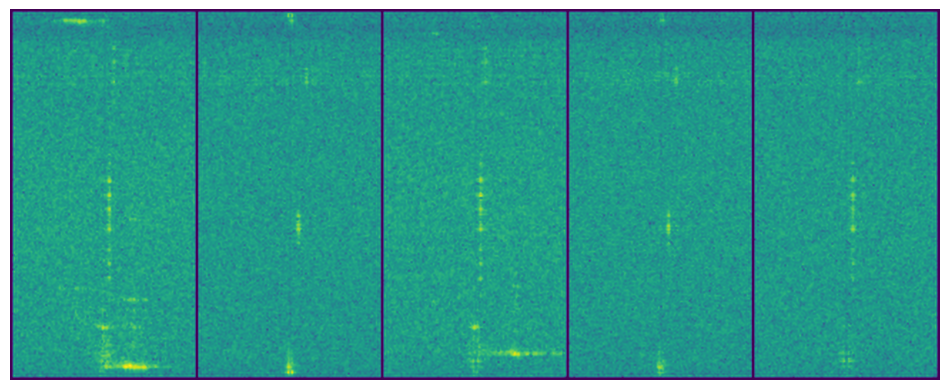

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'people', 'door_1', 'people', 'door_1']
Результат: [ True  True False  True False]


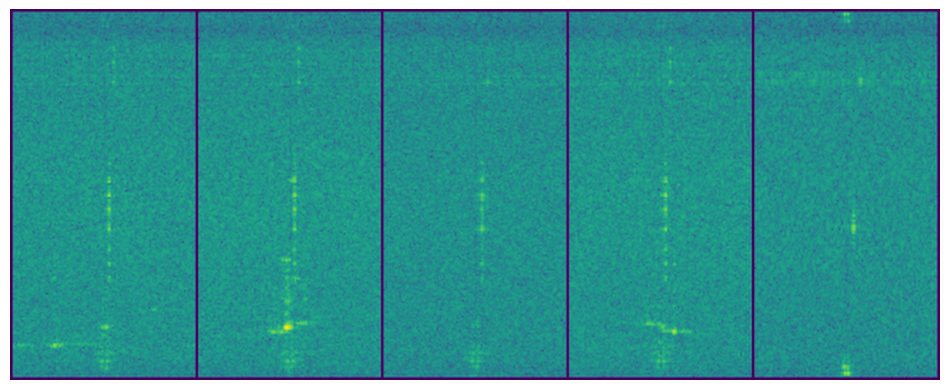

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'circle' 'people' 'people']
Классификация: ['door_1', 'people', 'circle', 'people', 'people']
Результат: [False  True  True  True  True]


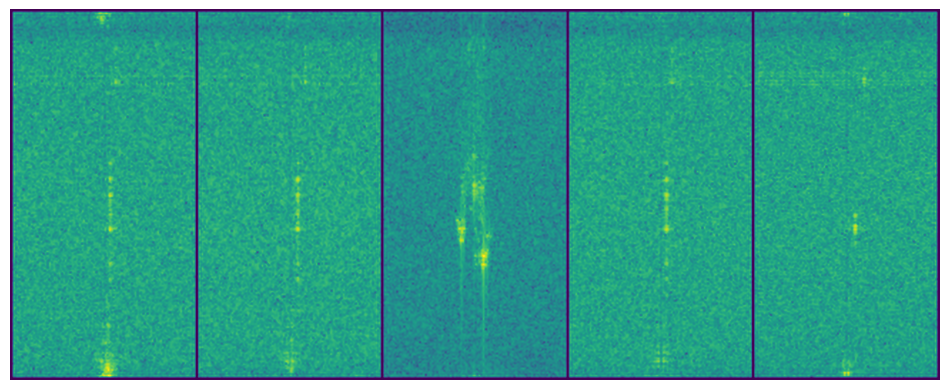

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'people', 'circle', 'people', 'people']
Результат: [ True  True False  True  True]


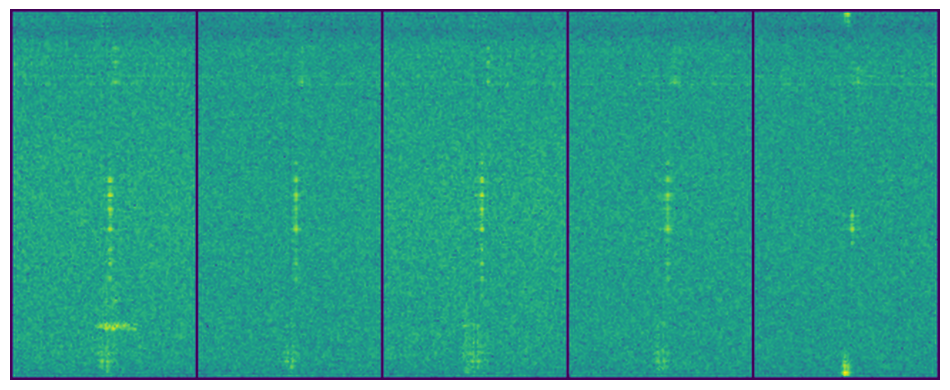

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'people', 'people', 'people', 'people']
Результат: [ True  True  True  True  True]


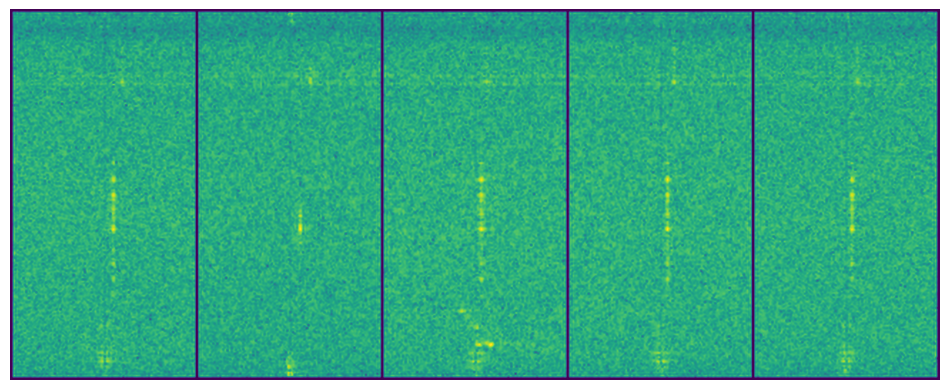

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['door_1', 'door_1', 'people', 'none_target', 'people']
Результат: [False False  True False  True]


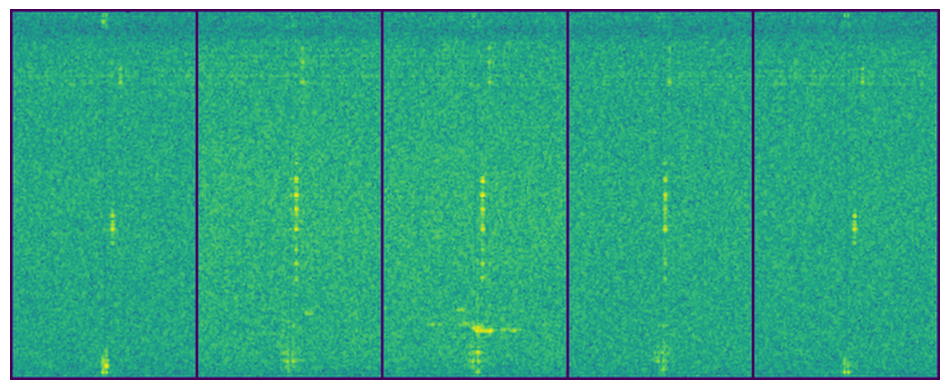

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['door_1', 'people', 'door_1', 'people', 'people']
Результат: [False  True False  True  True]


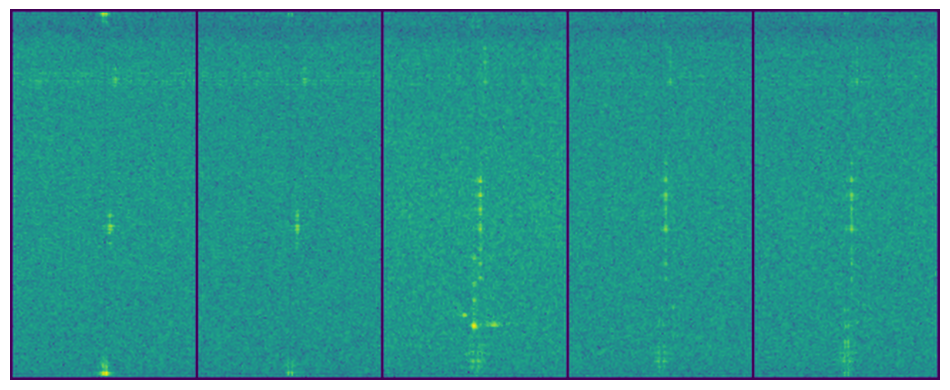

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'people', 'people', 'people', 'people']
Результат: [ True  True  True  True  True]


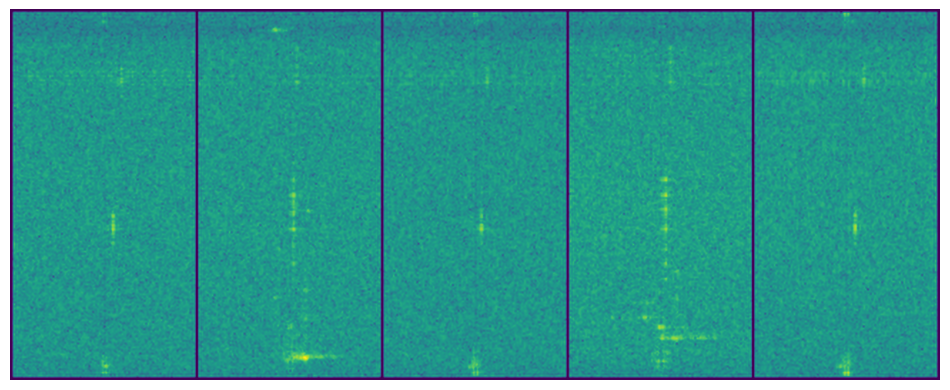

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'people', 'door_1', 'people', 'people']
Результат: [ True  True False  True  True]


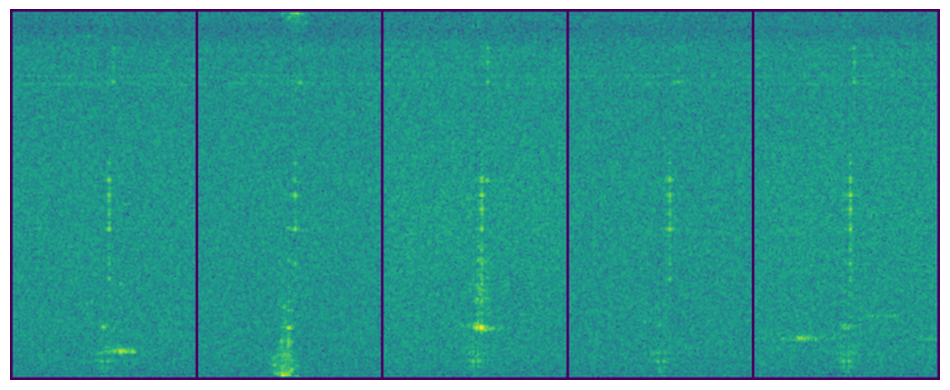

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'circle', 'people', 'people', 'circle']
Результат: [ True False  True  True False]


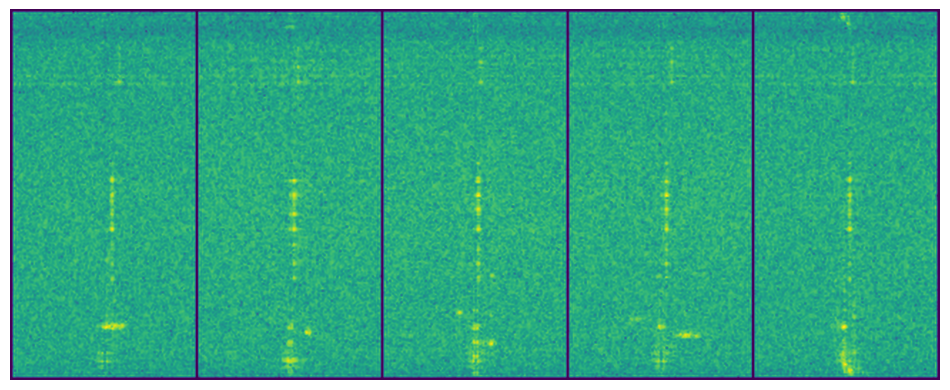

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['circle', 'people', 'people', 'circle', 'people']
Результат: [False  True  True False  True]


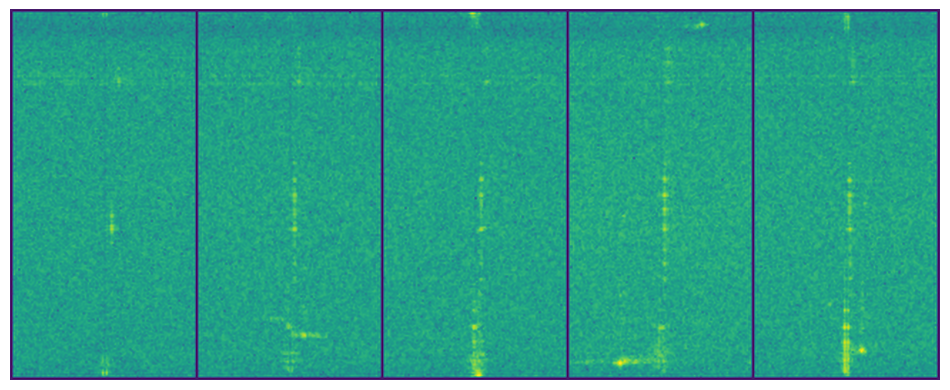

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['door_1', 'people', 'people', 'door_1', 'door_1']
Результат: [False  True  True False False]


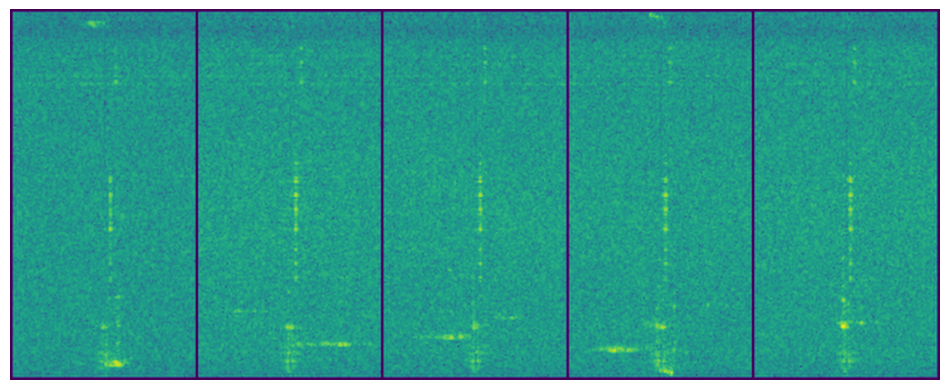

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'people', 'door_1', 'people', 'people']
Результат: [ True  True False  True  True]


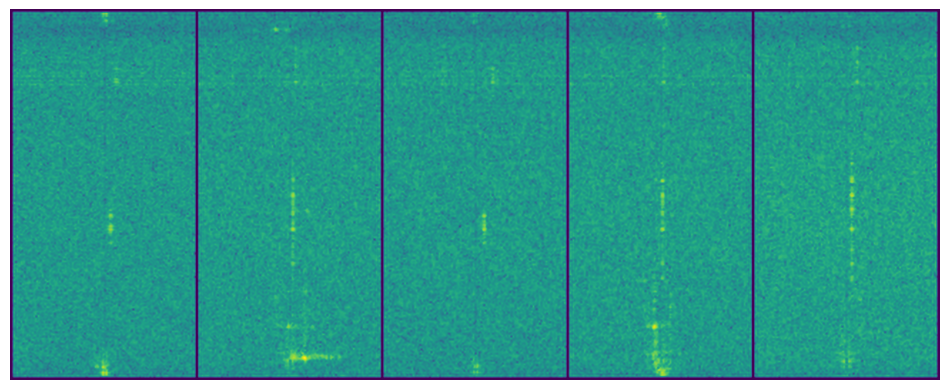

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'door_1']
Классификация: ['people', 'people', 'people', 'people', 'people']
Результат: [ True  True  True  True False]


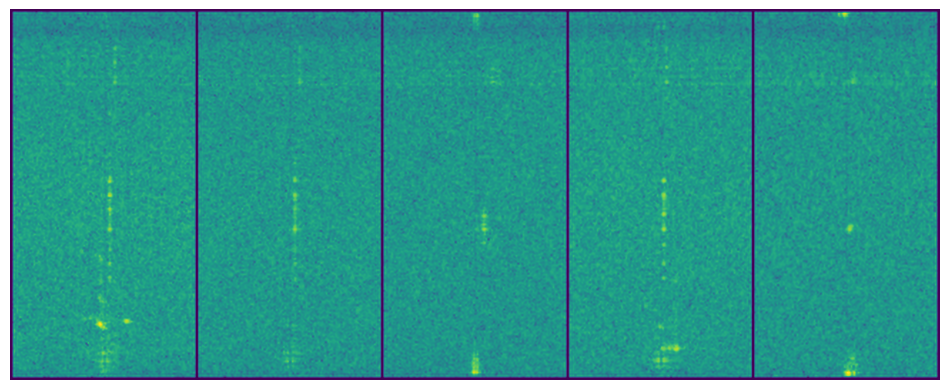

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['none_target', 'people', 'door_1', 'door_1', 'people']
Результат: [False  True False False  True]


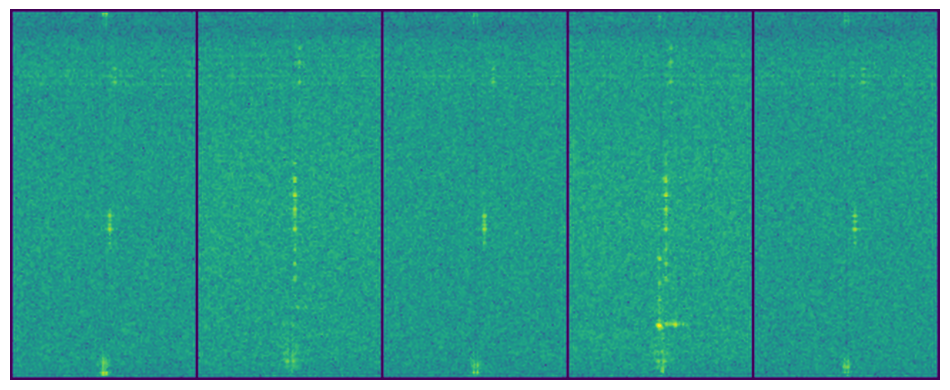

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'door_1', 'people', 'people', 'circle']
Результат: [ True False  True  True False]


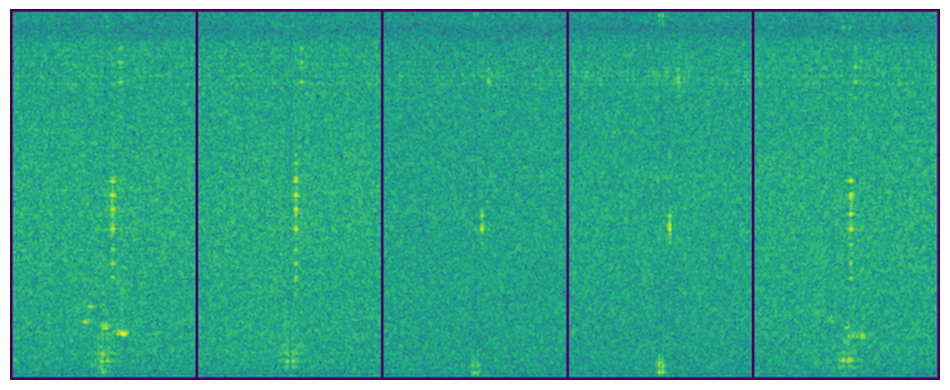

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['door_1', 'people', 'people', 'door_1', 'people']
Результат: [False  True  True False  True]


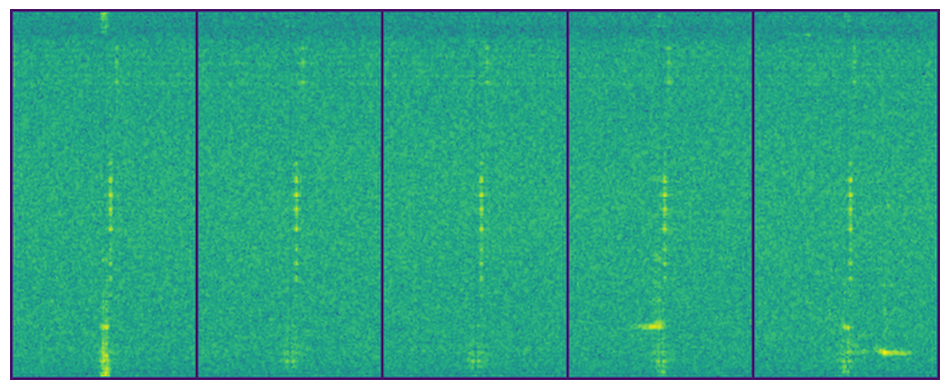

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'people']
Классификация: ['people', 'people', 'people', 'people', 'people']
Результат: [ True  True  True  True  True]


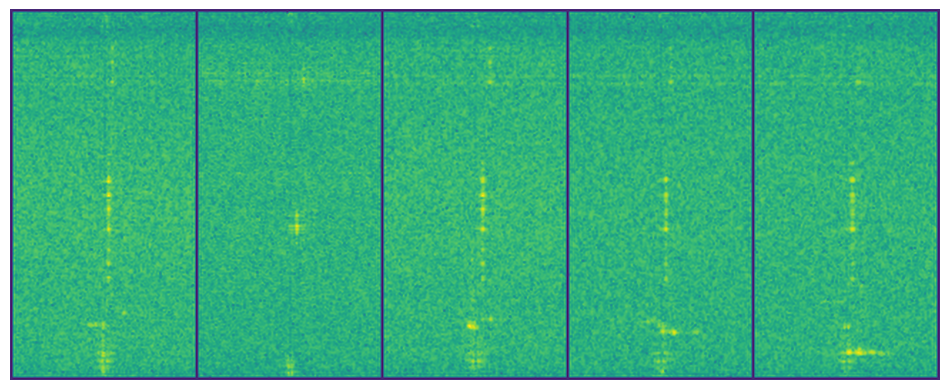

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'none_target' 'people']
Классификация: ['people', 'people', 'people', 'door_1', 'people']
Результат: [ True  True  True False  True]


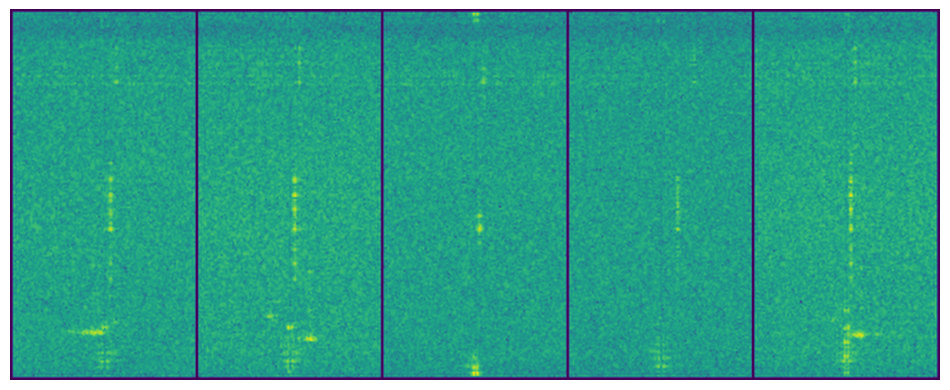

Всего доступно классов: ['circle', 'door_1', 'none_target', 'people']
Правда: ['people' 'people' 'people' 'people' 'door_1']
Классификация: ['people', 'people', 'people', 'door_1', 'door_1']
Результат: [ True  True  True False  True]


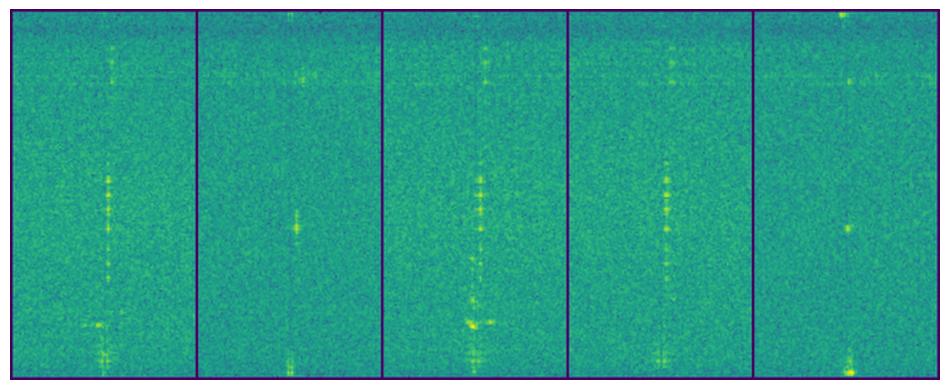

In [115]:
def imshow(inp, title = None):
    """Imshow for Batch of Tensor."""
    inp = inp.numpy().transpose((1, 2, 0));    
    plt.figure(figsize = (12, 16));
    plt.imshow(inp[:, :, 0], 
               origin = 'lower', interpolation = 'bessel');
    if title is not None:
        plt.title(title);
    plt.axis('off');
    plt.show();

for number in range(20):
    inputs = next(iter(data[number::BATCH_SIZE]))
    out = torchvision.utils.make_grid(inputs);
    
    print(f'Всего доступно классов: {class_names}');
    print(f'Правда: {fnames[number * BATCH_SIZE:(number + 1) * BATCH_SIZE]}');
    print(f'Классификация: {[class_names[x] for x in predicts[number * BATCH_SIZE:(number + 1) * BATCH_SIZE]]}');
    print(f'Результат: {fnames[number * BATCH_SIZE:(number + 1) * BATCH_SIZE] == [class_names[x] for x in predicts[number * BATCH_SIZE:(number + 1) * BATCH_SIZE]]}');
    
    imshow(out);